In [2]:
import yfinance as yf
from datetime import datetime
import datetime as dt
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
warnings.simplefilter('ignore')
from openpyxl.workbook import Workbook
import requests

In [3]:
pd.set_option('display.max_rows', None)
tickers_df=pd.read_csv(r'C:\Users\LENOVO\Downloads\fo_mktlots (1).csv',skiprows=4)

In [4]:
tickers_df
tickers_df.sort_values(by = 'Symbol')

,Derivatives on Individual Securities,Symbol,Feb-21,Mar-21,Apr-21,,.1,.2,.3,.4,.5,.6,.7,.8,.9,.10
0,AARTI INDUSTRIES LTD,AARTIIND,425,425,425,,,,,,,,,,,
32,ACC LIMITED,ACC,500,500,500,,,,,,,,,,,
1,ADANI ENTERPRISES LIMITED,ADANIENT,2000,2000,2000,,,,,,,,,,,
2,ADANI PORT & SEZ LTD,ADANIPORTS,2500,2500,2500,,,,,,,,,,,
3,AMARA RAJA BATTERIES LTD.,AMARAJABAT,1000,1000,1000,,,,,,,,,,,
83,AMBUJA CEMENTS LTD,AMBUJACEM,3000,3000,3000,,,,,,,,,,,
6,APOLLO HOSPITALS ENTER. L,APOLLOHOSP,500,500,500,,,,,,,,,,,
4,APOLLO TYRES LTD,APOLLOTYRE,5000,5000,5000,,,,,,,,,,,
5,ASHOK LEYLAND LTD,ASHOKLEY,9000,9000,9000,,,,,,,,,,,
7,ASIAN PAINTS LIMITED,ASIANPAINT,300,300,300,,,,,,,,,,,


In [9]:
datamaster_df=pd.DataFrame()

i=0
while i<len(tickers_df):
    ticker = tickers_df['Symbol'][i]+'.NS'
    eq_df = yf.download(ticker,'2020-05-01','2021-05-29')
    eq_df.reset_index(inplace=True)
    eq_df['Ticker']= ticker
    eq_df['PreviousClose']=eq_df['Close'].shift(1)
    eq_df=eq_df.dropna()
    eq_df['Rtnchg']= round(eq_df['Close'].pct_change()*100,2)
    eq_df['Gap']= round(eq_df['Open']-eq_df['PreviousClose'])
    eq_df['GapPct']= round(eq_df['Gap']/eq_df['PreviousClose']*100,2)
    eq_df['HLRange']= round((eq_df['High']-eq_df['Low'])/eq_df['PreviousClose']*100,2)
    eq_df['AdjHLRange']= round((eq_df['High']-eq_df['Low'])/(eq_df['PreviousClose']+eq_df['Open']/2)*100,2)   
    eq_df['Weekday']= eq_df['Date'].dt.weekday
    eq_df['Month']= eq_df['Date'].dt.month
    eq_df['Year']= eq_df['Date'].dt.year
    datamaster_df=datamaster_df.append(eq_df)
    i+=1

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [10]:
datamaster_df
datamaster_df.sort_values(by = ['Ticker', 'Date','Weekday'])

# writing to Excel
datatoexcel = pd.ExcelWriter('masterData.xlsx')
  
# write DataFrame to excel
datamaster_df.to_excel(datatoexcel)
  
# save the excel
datatoexcel.save()
print('DataFrame is written to Excel File successfully.')

DataFrame is written to Excel File successfully.


In [11]:
temp_df = datamaster_df[['Date','Ticker','Weekday','Month','Year','GapPct','AdjHLRange']]
[((datamaster_df['GapPct']>=1) |(datamaster_df['GapPct']<=-1)) 
& (datamaster_df['AdjHLRange']>=3)]
temp_df.sort_values(by = ['GapPct','Ticker', 'Date','Weekday', 'AdjHLRange'])

,Date,Ticker,Weekday,Month,Year,GapPct,AdjHLRange
28,2020-06-12,IDEA.NS,4,6,2020,-10.64,16.85
62,2020-07-30,PVR.NS,3,7,2020,-9.94,4.97
113,2020-10-12,VEDL.NS,0,10,2020,-9.85,9.93
28,2020-06-12,FEDERALBNK.NS,4,6,2020,-8.33,7.78
28,2020-06-12,IDFCFIRSTB.NS,4,6,2020,-8.03,8.79
178,2021-01-14,SAIL.NS,3,1,2021,-8.03,2.75
88,2020-09-04,IDEA.NS,4,9,2020,-7.97,12.09
28,2020-06-12,CHOLAFIN.NS,4,6,2020,-7.95,10.21
28,2020-06-12,ASHOKLEY.NS,4,6,2020,-7.83,7.57
28,2020-06-12,IBULHSGFIN.NS,4,6,2020,-7.83,6.55


array([[<AxesSubplot:title={'center':'Weekday'}>,
        <AxesSubplot:title={'center':'Month'}>],
       [<AxesSubplot:title={'center':'GapPct'}>,
        <AxesSubplot:title={'center':'AdjHLRange'}>]], dtype=object)

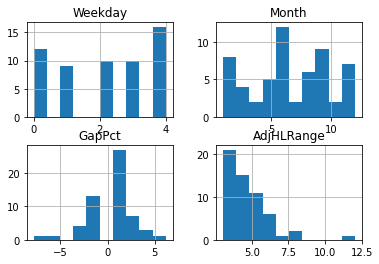

In [12]:
temp_df = datamaster_df[['Date','Ticker','Weekday','Month','GapPct','AdjHLRange']][((datamaster_df['GapPct']>=1) |
                                                                         (datamaster_df['GapPct']<=-1)) & 
                                                                        (datamaster_df['AdjHLRange']>=3) &
                                                                         (datamaster_df['Ticker']=='ASHOKLEY.NS')]
temp_df.sort_values(by = ['GapPct','Ticker', 'Date','Weekday', 'AdjHLRange']).hist()

<AxesSubplot:>

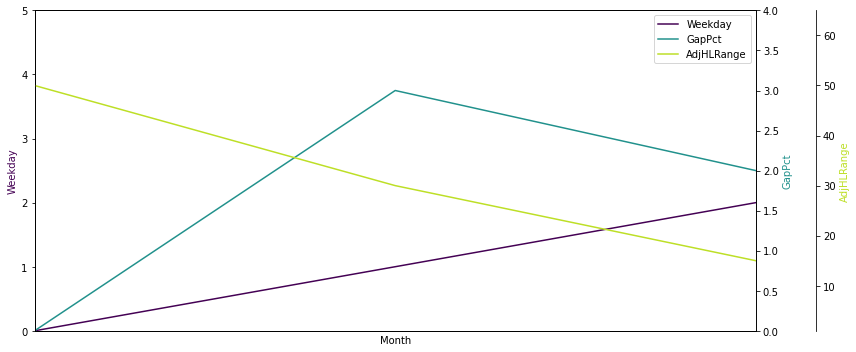

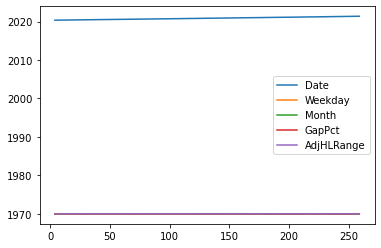

In [13]:
import matplotlib.pyplot as plt 

# Create figure and subplot manually
# fig = plt.figure()
# host = fig.add_subplot(111)

# More versatile wrapper
fig, host = plt.subplots(figsize=(12,5)) # (width, height) in inches
# (see https://matplotlib.org/3.3.3/api/_as_gen/matplotlib.pyplot.subplots.html)

par1 = host.twinx()
par2 = host.twinx()

host.set_xlim(0, 2)
host.set_ylim(0, 5)
par1.set_ylim(0, 4)
par2.set_ylim(1, 65)
    
host.set_xlabel("Month")
host.set_ylabel("Weekday")
par1.set_ylabel("GapPct")
par2.set_ylabel("AdjHLRange")

color1 = plt.cm.viridis(0)
color2 = plt.cm.viridis(0.5)
color3 = plt.cm.viridis(.9)

p1, = host.plot([0, 1, 2], [0, 1, 2],    color=color1, label="Weekday")
p2, = par1.plot([0, 1, 2], [0, 3, 2],    color=color2, label="GapPct")
p3, = par2.plot([0, 1, 2], [50, 30, 15], color=color3, label="AdjHLRange")

lns = [p1, p2, p3]
host.legend(handles=lns, loc='best')

# right, left, top, bottom
par2.spines['right'].set_position(('outward', 60))

# no x-ticks                 
par2.xaxis.set_ticks([])

# Sometimes handy, same for xaxis
#par2.yaxis.set_ticks_position('right')

# Move "GapPct"-axis to the left
# par2.spines['left'].set_position(('outward', 60))
# par2.spines['left'].set_visible(True)
# par2.yaxis.set_label_position('left')
# par2.yaxis.set_ticks_position('left')

host.yaxis.label.set_color(p1.get_color())
par1.yaxis.label.set_color(p2.get_color())
par2.yaxis.label.set_color(p3.get_color())

# Adjust spacings w.r.t. figsize
fig.tight_layout()
# Alternatively: bbox_inches='tight' within the plt.savefig function 
#                (overwrites figsize)

# Best for professional typesetting, e.g. LaTeX
plt.savefig("pyplot_multiple_y-axis.pdf")

temp_df.plot()

In [14]:
len(temp_df)

57

In [15]:
len(temp_df)/len(datamaster_df)*100

0.15248796147672553

In [16]:
yf.Ticker("ACC.NS").info

{'zip': '400020',
 'sector': 'Basic Materials',
 'fullTimeEmployees': 6300,
 'longBusinessSummary': 'ACC Limited manufactures and sells cement and ready-mix concrete in India. The company provides ordinary Portland cement; blended cement, including Portland Pozzolana cement, Portland slag cement, and composite cement; gold and silver range of cement; ready mixed concrete value-added products; and bulk cement. It also offers construction chemicals, such as ACC LeakBlock, a polymer-based integral waterproofing compound used in various types of cement mortar, plasters, and concrete; ACC LeakBlock WaterProof Plaster - LB 101, a ready-to-use cementitious waterproof mortar for internal and external plaster applications; and tile adhesives. In addition, the company provides EcoPact, a concrete with lower embodied carbon content for various structural components applications comprising foundations, columns, beams, external or internal walls, driveways, walkways, etc. It distributes its product

In [93]:
pd.set_option('display.max_rows', None)
Voltickers_df=pd.read_csv(r'C:\Users\LENOVO\Downloads\CMVOLT_16042021.csv')
convert_dict = {'Current Day Underlying Daily Volatility (E) = Sqrt(0.995*D*D + 0.005*C*C)': float,
                'Underlying Annualised Volatility (F) = E*Sqrt(365)': float
               }
Voltickerreplace_df = Voltickers_df.replace('-', '0')
Voltickerreplace_df = voltickerreplace.astype(convert_dict)
Voltickerreplace_df.dtypes

Date                                                                          object
Symbol                                                                        object
Underlying Close Price (A)                                                    object
Underlying Previous Day Close Price (B)                                       object
Underlying Log Returns (C) = LN(A/B)                                          object
Previous Day Underlying Volatility (D)                                        object
Current Day Underlying Daily Volatility (E) = Sqrt(0.995*D*D + 0.005*C*C)    float64
Underlying Annualised Volatility (F) = E*Sqrt(365)                           float64
dtype: object

In [94]:
Voltickerreplace_df

,Date,Symbol,Underlying Close Price (A),Underlying Previous Day Close Price (B),Underlying Log Returns (C) = LN(A/B),Previous Day Underlying Volatility (D),Current Day Underlying Daily Volatility (E) = Sqrt(0.995*D*D + 0.005*C*C),Underlying Annualised Volatility (F) = E*Sqrt(365)
0,16-APR-2021,20MICRONS,36.05,36.05,0.0000,0.0292,0.0291,0.5560
1,16-APR-2021,21STCENMGM,12.25,12.45,-0.0162,0.0221,0.0221,0.4222
2,16-APR-2021,3IINFOTECH,7.05,7.05,0.0000,0.0399,0.0398,0.7604
3,16-APR-2021,3MINDIA,27034.20,25532.95,0.0571,0.0228,0.0231,0.4413
4,16-APR-2021,3PLAND,9.85,9.80,0.0051,0.0600,0.0599,1.1444
5,16-APR-2021,500009,20.35,19.25,0.0556,0.0350,0.0352,0.6725
6,16-APR-2021,500012,63.15,60.20,0.0478,0.0350,0.0350,0.6687
7,16-APR-2021,500014,2.00,1.98,0.0101,0.0462,0.0461,0.8807
8,16-APR-2021,500016,4.61,4.61,0.0000,0.0340,0.0339,0.6477
9,16-APR-2021,500028,4.30,4.23,0.0164,0.0350,0.0350,0.6687


In [75]:
Voltickers_df_N100 = Voltickerreplace_df[['Date','Symbol','Current Day Underlying Daily Volatility (E) = Sqrt(0.995*D*D + 0.005*C*C)','Underlying Annualised Volatility (F) = E*Sqrt(365)']]
#[Voltickerreplace_df['Symbol'].isin(['AARTIIND','ACC','ADANIENT','ADANIPORTS','AMARAJABAT','AMBUJACEM','APOLLOHOSP','APOLLOTYRE','ASHOKLEY','ASIANPAINT','AUROPHARMA','AXISBANK','BAJAJ-AUTO','BAJAJFINSV','BAJFINANCE','BALKRISIND','BANDHANBNK','BANKBARODA','BATAINDIA','BEL','BERGEPAINT','BHARATFORG','BHARTIARTL','BHEL','BIOCON','BOSCHLTD','BPCL','BRITANNIA','CADILAHC','CANBK','CHOLAFIN','CIPLA','COALINDIA','COFORGE','COLPAL','CONCOR','CUMMINSIND','DABUR','DIVISLAB','DLF','DRREDDY','EICHERMOT','ESCORTS','EXIDEIND','FEDERALBNK','GAIL','GLENMARK','GMRINFRA','GODREJCP','GODREJPROP','GRASIM','HAVELLS','HCLTECH','HDFC','HDFCAMC','HDFCBANK','HDFCLIFE','HEROMOTOCO','HINDALCO','HINDPETRO','HINDUNILVR','IBULHSGFIN','ICICIBANK','ICICIGI','ICICIPRULI','IDEA','IDFCFIRSTB','IGL','INDIGO','INDUSINDBK','INDUSTOWER','INFY','IOC','ITC','JINDALSTEL','JSWSTEEL','JUBLFOOD','KOTAKBANK','L&TFH','LALPATHLAB','LICHSGFIN','LT','LUPIN','M&M','M&MFIN','MANAPPURAM','MARICO','MARUTI','MCDOWELL-N','MFSL','MGL','MINDTREE','MOTHERSUMI','MRF','MUTHOOTFIN','NATIONALUM','NAUKRI','NESTLEIND','NMDC','NTPC','ONGC','PAGEIND','PEL','PETRONET','PFC','PIDILITIND','PNB','POWERGRID','PVR','RAMCOCEM','RBLBANK','RECLTD','RELIANCE','SAIL','SBILIFE','SBIN','SHREECEM','SIEMENS','SRF','SRTRANSFIN','SUNPHARMA','SUNTV','TATACHEM','TATACONSUM','TATAMOTORS','TATAPOWER','TATASTEEL','TCS','TECHM','TITAN','TORNTPHARM','TORNTPOWER','TVSMOTOR','UBL','ULTRACEMCO','UPL','VEDL','VOLTAS','WIPRO','ZEEL'])]
Voltickers_df_N100

,Date,Symbol,Current Day Underlying Daily Volatility (E) = Sqrt(0.995*D*D + 0.005*C*C),Underlying Annualised Volatility (F) = E*Sqrt(365)
0,16-APR-2021,20MICRONS,0.0291,0.5560
1,16-APR-2021,21STCENMGM,0.0221,0.4222
2,16-APR-2021,3IINFOTECH,0.0398,0.7604
3,16-APR-2021,3MINDIA,0.0231,0.4413
4,16-APR-2021,3PLAND,0.0599,1.1444
5,16-APR-2021,500009,0.0352,0.6725
6,16-APR-2021,500012,0.0350,0.6687
7,16-APR-2021,500014,0.0461,0.8807
8,16-APR-2021,500016,0.0339,0.6477
9,16-APR-2021,500028,0.0350,0.6687


In [95]:
Voltickers_df_N100.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4128 entries, 0 to 4127
Data columns (total 4 columns):
 #   Column                                                                     Non-Null Count  Dtype  
---  ------                                                                     --------------  -----  
 0   Date                                                                       4128 non-null   object 
 1   Symbol                                                                     4128 non-null   object 
 2   Current Day Underlying Daily Volatility (E) = Sqrt(0.995*D*D + 0.005*C*C)  4128 non-null   float64
 3   Underlying Annualised Volatility (F) = E*Sqrt(365)                         4128 non-null   float64
dtypes: float64(2), object(2)
memory usage: 129.1+ KB


In [154]:
len(Voltickers_df_N100)

4128